import libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from sklearn.tree import DecisionTreeClassifier
from sklearn import tree
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import accuracy_score,confusion_matrix,roc_auc_score,roc_curve
from pandas_profiling import ProfileReport

imported dataset

In [2]:
df = pd.read_csv('winequality-red.csv')
df.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol,quality
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8,5
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8,5
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8,6
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4,5


How many distinct classes are present in quality column

In [3]:
set(df.quality)

{3, 4, 5, 6, 7, 8}

# Data Analysis

In [4]:
ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Splitting data into depenedent and independent features

In [5]:
y = df['quality']
y.head()

0    5
1    5
2    5
3    6
4    5
Name: quality, dtype: int64

In [6]:
x = df.drop(columns=['quality'])
x.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
0,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4
1,7.8,0.88,0.00,2.6,0.098,25.0,67.0,0.9968,3.20,0.68,9.8
2,7.8,0.76,0.04,2.3,0.092,15.0,54.0,0.9970,3.26,0.65,9.8
3,11.2,0.28,0.56,1.9,0.075,17.0,60.0,0.9980,3.16,0.58,9.8
4,7.4,0.70,0.00,1.9,0.076,11.0,34.0,0.9978,3.51,0.56,9.4


splitting data into train and test data

In [7]:
x_train,x_test,y_train,y_test = train_test_split(x,y,test_size=0.25, random_state=30)

In [8]:
x_train.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1178,5.6,0.915,0.00,2.1,0.041,17.0,78.0,0.99346,3.68,0.73,11.4
1189,8.8,0.955,0.05,1.8,0.075,5.0,19.0,0.99616,3.30,0.44,9.6
161,7.6,0.680,0.02,1.3,0.072,9.0,20.0,0.99650,3.17,1.08,9.2
109,8.1,0.785,0.52,2.0,0.122,37.0,153.0,0.99690,3.21,0.69,9.3
961,7.1,0.560,0.14,1.6,0.078,7.0,18.0,0.99592,3.27,0.62,9.3


In [9]:
y_train.head()

1178    5
1189    4
161     4
109     5
961     5
Name: quality, dtype: int64

In [10]:
x_test.head()

,fixed acidity,volatile acidity,citric acid,residual sugar,chlorides,free sulfur dioxide,total sulfur dioxide,density,pH,sulphates,alcohol
1147,10.0,0.410,0.45,6.2,0.071,6.0,14.0,0.99702,3.21,0.49,11.8
659,7.1,0.840,0.02,4.4,0.096,5.0,13.0,0.99700,3.41,0.57,11.0
871,6.9,0.560,0.03,1.5,0.086,36.0,46.0,0.99522,3.53,0.57,10.6
1333,9.1,0.775,0.22,2.2,0.079,12.0,48.0,0.99760,3.18,0.51,9.6
1411,6.4,0.470,0.40,2.4,0.071,8.0,19.0,0.99630,3.56,0.73,10.6


In [11]:
y_test.head()

1147    7
659     4
871     5
1333    5
1411    6
Name: quality, dtype: int64

In [12]:
dt_model = DecisionTreeClassifier()
dt_model.fit(x_train, y_train)

DecisionTreeClassifier()

importred tree to display actual tree 

In [13]:
import sklearn
from sklearn import tree
%matplotlib inline

[Text(610.4400223456122, 1057.0, 'X[10] <= 10.35\ngini = 0.642\nsamples = 1199\nvalue = [8, 35, 512, 477, 153, 14]'),
 Text(357.9221627843987, 996.6, 'X[6] <= 95.5\ngini = 0.528\nsamples = 666\nvalue = [6, 20, 406, 209, 23, 2]'),
 Text(222.77303629469122, 936.2, 'X[9] <= 0.585\ngini = 0.554\nsamples = 584\nvalue = [6, 19, 332, 202, 23, 2]'),
 Text(81.259127843987, 875.8, 'X[6] <= 90.5\ngini = 0.468\nsamples = 261\nvalue = [3, 14, 179, 63, 2, 0]'),
 Text(56.75216684723727, 815.4000000000001, 'X[10] <= 9.075\ngini = 0.453\nsamples = 250\nvalue = [3, 14, 176, 55, 2, 0]'),
 Text(19.34561213434453, 755.0, 'X[6] <= 39.0\ngini = 0.604\nsamples = 15\nvalue = [0, 2, 6, 7, 0, 0]'),
 Text(11.607367280606718, 694.6, 'X[6] <= 29.5\ngini = 0.406\nsamples = 8\nvalue = [0, 1, 1, 6, 0, 0]'),
 Text(7.738244853737812, 634.2, 'X[0] <= 6.95\ngini = 0.5\nsamples = 2\nvalue = [0, 1, 1, 0, 0, 0]'),
 Text(3.869122426868906, 573.8, 'gini = 0.0\nsamples = 1\nvalue = [0, 1, 0, 0, 0, 0]'),
 Text(11.607367280606718

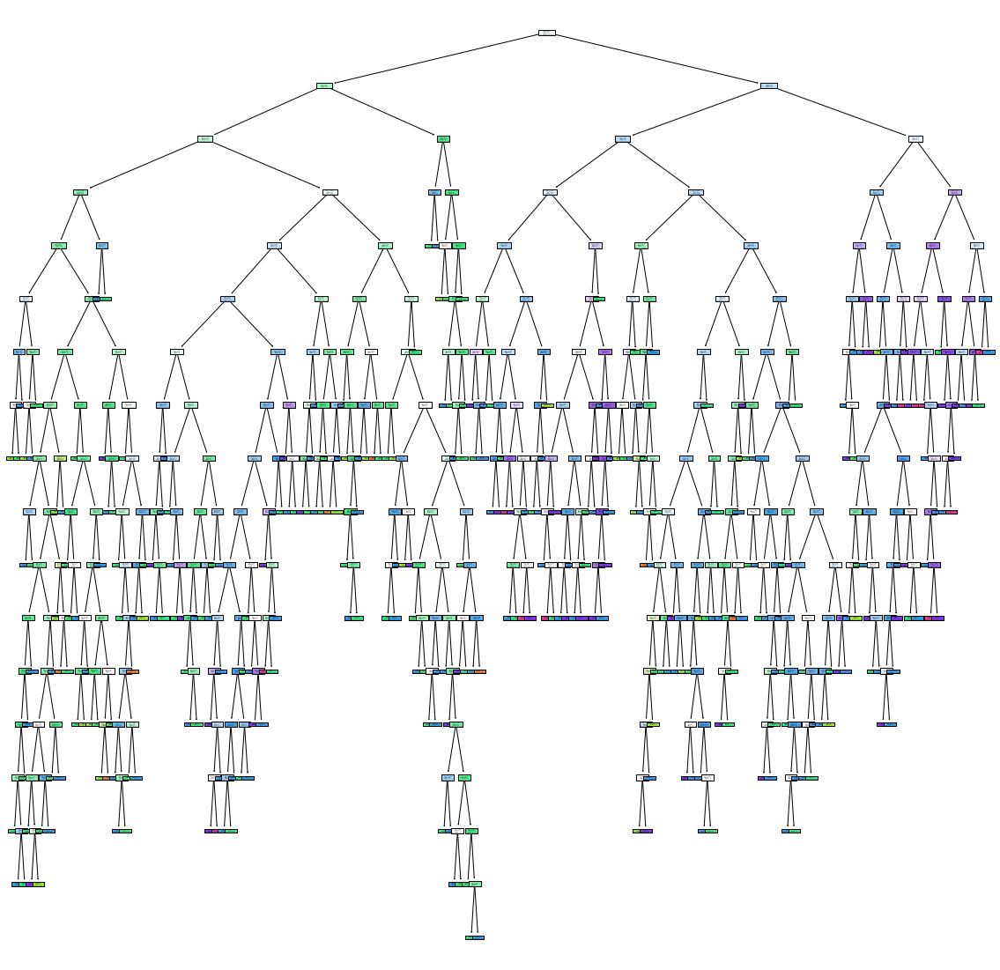

In [14]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model,filled=True)

In [15]:
df_head = df.head(30)

In [16]:
x1=df_head.drop(columns=['quality'])
y1=df_head['quality']

In [17]:
df_head_dt= DecisionTreeClassifier()
df_head_dt.fit(x1,y1)

DecisionTreeClassifier()

acutal tree with its parameter

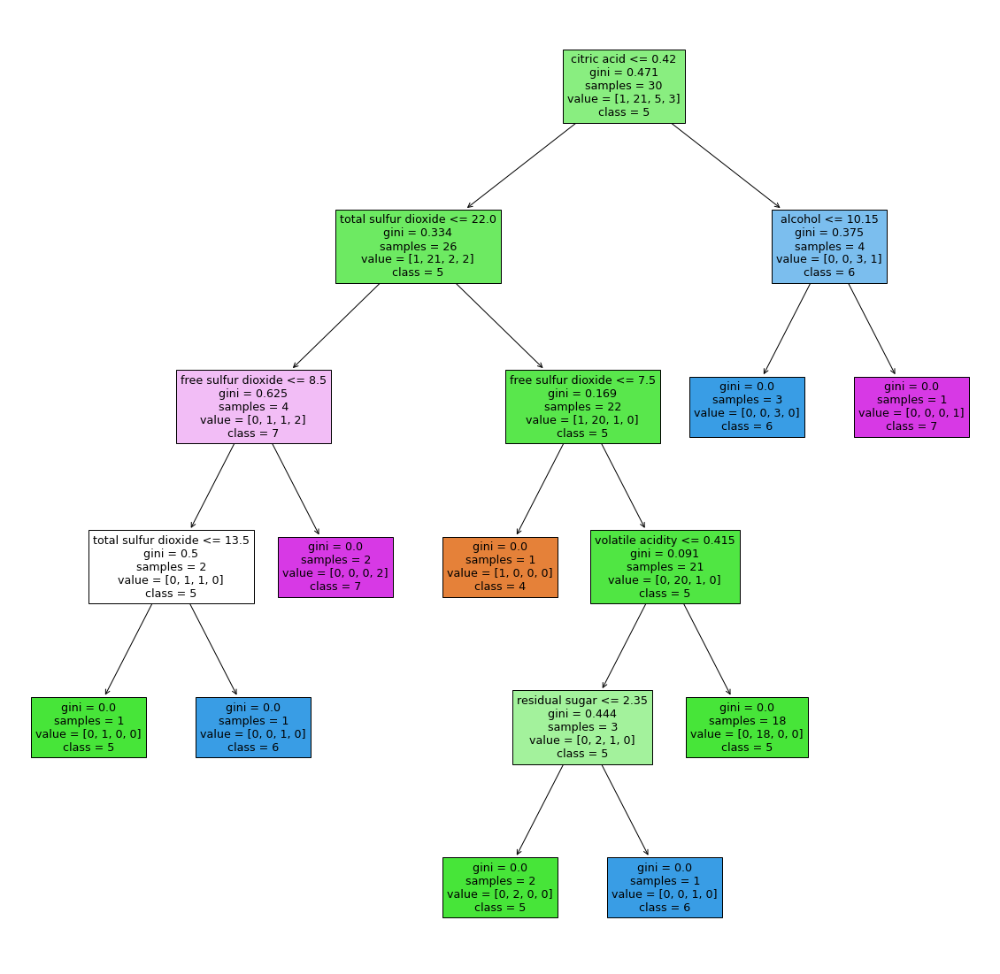

In [18]:
plt.figure(figsize=(20,20))
tree.plot_tree(df_head_dt, filled=True, class_names=[str(i) for i in set(y1)],feature_names=x1.columns)
plt.savefig('decisiontree')

In [19]:
df_head_dt.predict(x1)

array([5, 5, 5, 6, 5, 5, 5, 7, 7, 5, 5, 5, 5, 5, 5, 5, 7, 5, 4, 6, 6, 5,
       5, 5, 6, 5, 5, 5, 5, 6], dtype=int64)

In [20]:
df_head_dt.score(x1,y1)

1.0

In [21]:
df_head_dt.score(x_test,y_test)

0.4425

In [22]:
dt_model.score(x_test,y_test)

0.6175

In [23]:
dt_model.score(x_train,y_train)

1.0

conclusion - we can see here training accuracy is more as comapre to 
test accuracy, hence we can say model is over fitted. 

# Pruning

In [24]:
path = df_head_dt.cost_complexity_pruning_path(x_train,y_train)
path

{'ccp_alphas': array([0.        , 0.00062552, 0.00074136, 0.00076453, 0.00076731,
        0.00077445, 0.00077445, 0.00077843, 0.00078497, 0.00079013,
        0.00079013, 0.00079431, 0.00080067, 0.00080541, 0.00081086,
        0.00083403, 0.00083403, 0.00083403, 0.00083403, 0.00083403,
        0.00083403, 0.00083403, 0.00083403, 0.00083403, 0.00083403,
        0.00083403, 0.00083403, 0.00083403, 0.00083403, 0.00083403,
        0.00083403, 0.00083403, 0.00083403, 0.00083403, 0.00083403,
        0.00083403, 0.00083403, 0.00104254, 0.00104254, 0.00104254,
        0.00111204, 0.00111204, 0.00111204, 0.00111204, 0.00111204,
        0.00111204, 0.00111204, 0.00111204, 0.00111204, 0.00115065,
        0.00116476, 0.00117619, 0.00125104, 0.00125104, 0.00125104,
        0.00125104, 0.00125104, 0.00125104, 0.00125104, 0.00125104,
        0.00125104, 0.00125104, 0.00125104, 0.00125104, 0.00127822,
        0.00129813, 0.00129933, 0.00131062, 0.00131062, 0.00132128,
        0.00132205, 0.00133152, 0.

In [25]:
ccp_alpha=path['ccp_alphas']
ccp_alpha

array([0.        , 0.00062552, 0.00074136, 0.00076453, 0.00076731,
       0.00077445, 0.00077445, 0.00077843, 0.00078497, 0.00079013,
       0.00079013, 0.00079431, 0.00080067, 0.00080541, 0.00081086,
       0.00083403, 0.00083403, 0.00083403, 0.00083403, 0.00083403,
       0.00083403, 0.00083403, 0.00083403, 0.00083403, 0.00083403,
       0.00083403, 0.00083403, 0.00083403, 0.00083403, 0.00083403,
       0.00083403, 0.00083403, 0.00083403, 0.00083403, 0.00083403,
       0.00083403, 0.00083403, 0.00104254, 0.00104254, 0.00104254,
       0.00111204, 0.00111204, 0.00111204, 0.00111204, 0.00111204,
       0.00111204, 0.00111204, 0.00111204, 0.00111204, 0.00115065,
       0.00116476, 0.00117619, 0.00125104, 0.00125104, 0.00125104,
       0.00125104, 0.00125104, 0.00125104, 0.00125104, 0.00125104,
       0.00125104, 0.00125104, 0.00125104, 0.00125104, 0.00127822,
       0.00129813, 0.00129933, 0.00131062, 0.00131062, 0.00132128,
       0.00132205, 0.00133152, 0.00133445, 0.00133445, 0.00133

In [26]:
impu=path['impurities']
impu

array([0.        , 0.00125104, 0.00273376, 0.00426281, 0.00733204,
       0.00888095, 0.01042986, 0.01198671, 0.01355664, 0.01513691,
       0.01671717, 0.0183058 , 0.01990713, 0.02151795, 0.02313967,
       0.0239737 , 0.02480773, 0.02564176, 0.02647579, 0.02730982,
       0.02814384, 0.02897787, 0.0298119 , 0.03064593, 0.03147996,
       0.03314801, 0.03398204, 0.03481607, 0.0356501 , 0.03648413,
       0.03731816, 0.03815218, 0.03898621, 0.03982024, 0.04065427,
       0.04232233, 0.04315635, 0.04628396, 0.04836903, 0.05149664,
       0.05260868, 0.05372071, 0.05483275, 0.05594479, 0.05705683,
       0.05816886, 0.0592809 , 0.06039294, 0.06261702, 0.06721962,
       0.06954914, 0.07660631, 0.07785735, 0.07910839, 0.08035944,
       0.08286152, 0.08536361, 0.08661465, 0.08786569, 0.08911673,
       0.09036778, 0.09286986, 0.0941209 , 0.09537195, 0.09665017,
       0.10054455, 0.10314321, 0.10576444, 0.10838567, 0.10970695,
       0.11235105, 0.11368257, 0.11501702, 0.11635146, 0.11768

training multiple models by tunning ccp_alpha value

In [27]:
dt_model2 = []
for i in ccp_alpha:
    dt_m = DecisionTreeClassifier(ccp_alpha=i)
    dt_m.fit(x_train,y_train)
    dt_model2.append(dt_m)

In [28]:
dt_model2

[DecisionTreeClassifier(),
 DecisionTreeClassifier(ccp_alpha=0.0006255212677231026),
 DecisionTreeClassifier(ccp_alpha=0.000741358539523677),
 DecisionTreeClassifier(ccp_alpha=0.0007645259938837922),
 DecisionTreeClassifier(ccp_alpha=0.0007673060884070058),
 DecisionTreeClassifier(ccp_alpha=0.0007744549028952701),
 DecisionTreeClassifier(ccp_alpha=0.0007744549028952701),
 DecisionTreeClassifier(ccp_alpha=0.0007784264664998612),
 DecisionTreeClassifier(ccp_alpha=0.0007849678653780112),
 DecisionTreeClassifier(ccp_alpha=0.0007901321276502352),
 DecisionTreeClassifier(ccp_alpha=0.0007901321276502352),
 DecisionTreeClassifier(ccp_alpha=0.0007943127209182258),
 DecisionTreeClassifier(ccp_alpha=0.0008006672226855711),
 DecisionTreeClassifier(ccp_alpha=0.0008054097368722303),
 DecisionTreeClassifier(ccp_alpha=0.0008108609026040222),
 DecisionTreeClassifier(ccp_alpha=0.0008340283569641367),
 DecisionTreeClassifier(ccp_alpha=0.0008340283569641367),
 DecisionTreeClassifier(ccp_alpha=0.0008340283

ccp_alpha is threshold it means complexicity of any branches is more tha than ccp alpha then tree is not going to create that branch

In [29]:
trainning_score = [i.score(x_train,y_train)for i in dt_model2]
trainning_score

[1.0,
 1.0,
 0.9966638865721434,
 0.9966638865721434,
 0.9958298582151793,
 0.994161801501251,
 0.9908256880733946,
 0.9916597164303587,
 0.9924937447873228,
 0.9899916597164303,
 0.9916597164303587,
 0.9899916597164303,
 0.987489574645538,
 0.9883236030025021,
 0.9883236030025021,
 0.9683069224353628,
 0.9658048373644704,
 0.9658048373644704,
 0.9649708090075062,
 0.9674728940783986,
 0.9674728940783986,
 0.9666388657214345,
 0.9674728940783986,
 0.9683069224353628,
 0.9666388657214345,
 0.9683069224353628,
 0.9658048373644704,
 0.9666388657214345,
 0.9658048373644704,
 0.9658048373644704,
 0.9658048373644704,
 0.9666388657214345,
 0.9658048373644704,
 0.9658048373644704,
 0.9666388657214345,
 0.9674728940783986,
 0.9666388657214345,
 0.9599666388657214,
 0.9599666388657214,
 0.9599666388657214,
 0.9557964970809008,
 0.9532944120100083,
 0.9549624687239366,
 0.9541284403669725,
 0.9557964970809008,
 0.9549624687239366,
 0.9541284403669725,
 0.9557964970809008,
 0.9557964970809008,
 0.

In [30]:
testing_score = [i.score(x_test,y_test)for i in dt_model2]
testing_score

[0.61,
 0.6175,
 0.61,
 0.625,
 0.6325,
 0.625,
 0.6225,
 0.6225,
 0.6225,
 0.63,
 0.6075,
 0.6325,
 0.625,
 0.6275,
 0.615,
 0.6125,
 0.635,
 0.6225,
 0.6275,
 0.625,
 0.6275,
 0.625,
 0.6275,
 0.6175,
 0.615,
 0.6175,
 0.6375,
 0.6325,
 0.63,
 0.63,
 0.6225,
 0.63,
 0.625,
 0.62,
 0.625,
 0.6275,
 0.625,
 0.625,
 0.62,
 0.64,
 0.6125,
 0.625,
 0.61,
 0.615,
 0.6275,
 0.63,
 0.6375,
 0.635,
 0.6125,
 0.63,
 0.6325,
 0.6275,
 0.62,
 0.6225,
 0.62,
 0.615,
 0.6125,
 0.62,
 0.605,
 0.63,
 0.6175,
 0.6225,
 0.6275,
 0.61,
 0.6175,
 0.6225,
 0.6125,
 0.6225,
 0.6125,
 0.6125,
 0.6175,
 0.625,
 0.63,
 0.6125,
 0.6125,
 0.63,
 0.63,
 0.625,
 0.61,
 0.61,
 0.61,
 0.62,
 0.6175,
 0.625,
 0.6275,
 0.6325,
 0.6375,
 0.6225,
 0.625,
 0.6375,
 0.625,
 0.62,
 0.6175,
 0.6275,
 0.63,
 0.625,
 0.625,
 0.6375,
 0.62,
 0.62,
 0.6275,
 0.6175,
 0.62,
 0.63,
 0.6225,
 0.625,
 0.63,
 0.6225,
 0.63,
 0.6275,
 0.635,
 0.6375,
 0.635,
 0.635,
 0.635,
 0.6275,
 0.6425,
 0.635,
 0.6425,
 0.6425,
 0.6475,
 0.64

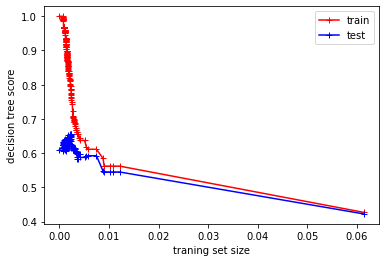

In [31]:
plt.plot(ccp_alpha, trainning_score, 'r-+', label = 'train')
plt.plot(ccp_alpha, testing_score, 'b-+', label = 'test')
plt.xlabel('traning set size')
plt.ylabel('decision tree score')
plt.legend()

In [33]:
dt_model_new = DecisionTreeClassifier(random_state=0, ccp_alpha=0.012)
dt_model_new.fit(x_train,y_train)

DecisionTreeClassifier(ccp_alpha=0.012, random_state=0)

[Text(446.4, 906.0, 'X[10] <= 10.35\ngini = 0.642\nsamples = 1199\nvalue = [8, 35, 512, 477, 153, 14]'),
 Text(223.2, 543.6, 'gini = 0.528\nsamples = 666\nvalue = [6, 20, 406, 209, 23, 2]'),
 Text(669.5999999999999, 543.6, 'X[10] <= 11.55\ngini = 0.647\nsamples = 533\nvalue = [2, 15, 106, 268, 130, 12]'),
 Text(446.4, 181.19999999999993, 'gini = 0.629\nsamples = 356\nvalue = [2, 13, 96, 186, 55, 4]'),
 Text(892.8, 181.19999999999993, 'gini = 0.6\nsamples = 177\nvalue = [0, 2, 10, 82, 75, 8]')]

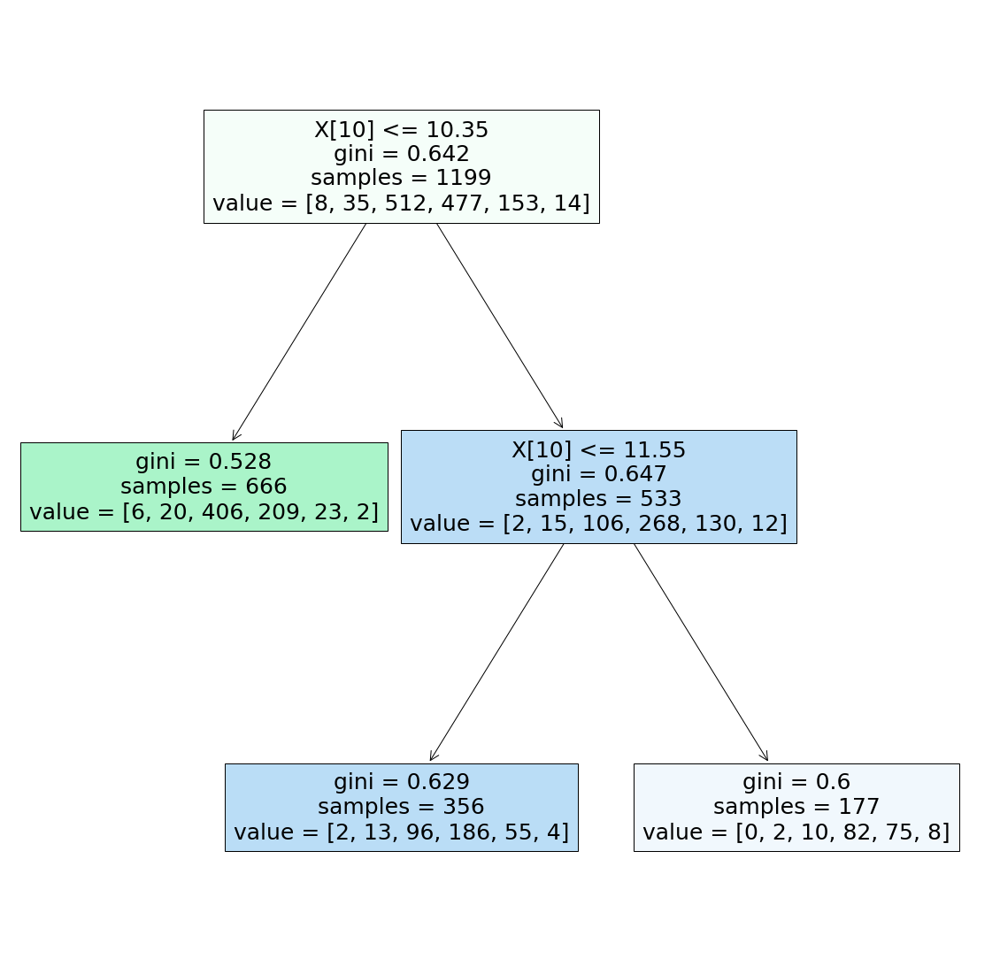

In [35]:
plt.figure(figsize=(20,20))
tree.plot_tree(dt_model_new, filled=True)

In [36]:
dt_model_new.score(x_train,y_train)

0.5621351125938282

In [37]:
dt_model_new.score(x_test,y_test)

0.545

# Random Search CV & Grid Search CV

In [39]:
grid_cv = {
    'criterion':['gini','entropy'],
    'splitter':['best','random'],
    'max_depth':range(2,40,1),
    'min_samples_split':range(2,10,1) ,
    'min_samples_leaf':(2,10,1) 
}

In [40]:
grid_ccp_result = GridSearchCV(estimator=dt_model_new, param_grid=grid_cv, cv = 5, n_jobs= 4)
grid_ccp_result.fit(x_train,y_train)

GridSearchCV(cv=5,
             estimator=DecisionTreeClassifier(ccp_alpha=0.012, random_state=0),
             n_jobs=4,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': (2, 10, 1),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [41]:
grid_ccp_result.best_params_

{'criterion': 'entropy',
 'max_depth': 8,
 'min_samples_leaf': 2,
 'min_samples_split': 5,
 'splitter': 'best'}

In [42]:
dt_model_gridsearchcv=DecisionTreeClassifier(criterion= 'entropy',
 max_depth= 8,
 min_samples_leaf= 2,
 min_samples_split= 5,
 splitter= 'best')

In [43]:
dt_model_gridsearchcv.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=8, min_samples_leaf=2,
                       min_samples_split=5)

In [44]:
dt_model_gridsearchcv.score(x_train,y_train)

0.7831526271893244

In [45]:
dt_model_gridsearchcv.score(x_test,y_test)

0.585

even after applying grid search cv we are getting over fit model, hence we are going to apply 
cv 

In [48]:
grid_ccp_result1 = GridSearchCV(estimator=dt_model_new,cv=10, param_grid=grid_cv, n_jobs= 4)
grid_ccp_result1.fit(x_train,y_train)

C:\Users\Sk\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:666: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(("The least populated class in y has only %d"


GridSearchCV(cv=10,
             estimator=DecisionTreeClassifier(ccp_alpha=0.012, random_state=0),
             n_jobs=4,
             param_grid={'criterion': ['gini', 'entropy'],
                         'max_depth': range(2, 40),
                         'min_samples_leaf': (2, 10, 1),
                         'min_samples_split': range(2, 10),
                         'splitter': ['best', 'random']})

In [49]:
grid_ccp_result1.best_params_

{'criterion': 'entropy',
 'max_depth': 3,
 'min_samples_leaf': 2,
 'min_samples_split': 2,
 'splitter': 'best'}

In [50]:
dt_model_gridsearchcv1 = DecisionTreeClassifier(criterion= 'entropy',
 max_depth= 3,
 min_samples_leaf= 2,
 min_samples_split= 2,
 splitter= 'best')

In [51]:
dt_model_gridsearchcv1.fit(x_train,y_train)

DecisionTreeClassifier(criterion='entropy', max_depth=3, min_samples_leaf=2)

In [52]:
dt_model_gridsearchcv1.score(x_train,y_train)

0.5979983319432861

In [53]:
dt_model_gridsearchcv1.score(x_test,y_test)

0.57

after changing value of cv we got model without over fit. 
we can also check with different permitution and combination.

Again we are trying to tune ccp parameter along with previous model.

In [56]:
grid_cv_ccp = {
    'criterion':['gini','entropy'],
    'splitter':['best','random'],
    'max_depth':range(2,40,1),
    'min_samples_split':range(2,10,1) ,
    'min_samples_leaf':(2,10,1),
    'ccp_alpha' : np.random.rand(20)
}

In [ ]:
grid_with_ccp=GridSearchCV(estimator=dt_model_new, cv=10, param_grid = grid_cv_ccp,n_jobs=4)
grid_with_ccp.fit(x_train,y_train)

C:\Users\Sk\anaconda3\lib\site-packages\sklearn\model_selection\_split.py:666: UserWarning: The least populated class in y has only 8 members, which is less than n_splits=10.
  warnings.warn(("The least populated class in y has only %d"
